<a href="https://colab.research.google.com/github/JohnPPinto/Deep-Learning-Projects/blob/main/UNet_Segmentation_on_a_Drone_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Semantic Segmentation on Drone Dataset using U-Net Architecture

## Dataset Overview

![Semantic Drone Dataset](https://www.tugraz.at/fileadmin/_migrated/pics/fyler3.png)

In this notebook, I will be using the dataset called Semantic Drone Dataset, this data focuses on the semantic understanding of the urban scenes for increasing the safety of the autonomous drone flight and landing procedures.

The imagery data is been taken through the point of nadir(Bird's eye) view at an altitude of 5 to 30 meters above ground containing more than 20 houses, and an high resolution camera was used to acquire the dataset, the size o the image is 6000 X 4000 px. Total dataset contains 600 images where 400 is for training set(Public) and 200 is for test set(Private).

Along with the images there are annotation for different task like bounding box, pixel-accurate mask annotation. There are in total 20 classes in the dataset namely:

1. unlabeled
2. paved-area
3. dirt
4. grass
5. gravel
6. water
7. rocks
8. pool
9. vegetation
10. roof
11. wall
12. window
13. door
14. fence
15. fence-pole
16. person
17. dog
18. car
19. bicycle
20. tree
21. bald-tree
22. ar-marker
23. obstacle
24. conflicting

You can check the license and other details on the official website of the dataset, http://dronedataset.icg.tugraz.at/.

## 1. Data Collection and Extraction

In [1]:
!pip install -Uq albumentations torchinfo torchview

import os
import requests
import shutil
import bs4
import glob
import random
import credentials
import numpy as np
import cv2
import csv
import pickle
import matplotlib.pyplot as plt
from collections import Counter
from xml.etree import ElementTree
from tqdm.auto import tqdm
from PIL import Image
from joblib import Parallel, delayed
import albumentations as A
from albumentations.pytorch import ToTensorV2

import torch
import torch.nn as nn
from torchinfo import summary
from torchview import draw_graph
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF

In [2]:
# Creating a directory for downloading and storing the dataset
data_dir = 'original_data'
data_file = os.path.join(data_dir,
                         'semantic_drone_dataset.zip')

if os.path.exists(data_dir):
    shutil.rmtree(data_dir) # Delete the directory if exist

if not os.path.exists(data_dir):
    os.makedirs(data_dir)
    print(f'Data directory has been created.')
    print(f'Downloading the semantic drone dataset.')

Data directory has been created.


In [3]:
# Login into the website provided by the owners of the dataset
s = requests.Session()
r = s.get('https://files.icg.tugraz.at/f/9b69f0024b4e4e98abdd/')
soup = bs4.BeautifulSoup(r.text, 'lxml')

# Getting the token and attaching the password to the payload and sending post request
login_payload = {field['name']: field['value'] for field in soup.select('input[value]')}
s.post('https://files.icg.tugraz.at/f/9b69f0024b4e4e98abdd/',
       data={'csrfmiddlewaretoken': login_payload.get('csrfmiddlewaretoken'),
             'token': login_payload.get('token'),
             'password': credentials.drone_dataset_password}) # Provided by the owners, when you signup

<Response [200]>

In [4]:
# Getting the dataset url from the dataset page
r = s.get('https://files.icg.tugraz.at/f/9b69f0024b4e4e98abdd/')
soup = bs4.BeautifulSoup(r.content, 'html.parser')
script_tag = soup.find_all('script', string=True)
for script in script_tag:
    for i in script.string.split('\n'):
        if i.startswith('      rawPath:'):
            dataset_url = i.split("'")[-2].replace('\\u002D', '-')
dataset_url

'https://files.icg.tugraz.at/seafhttp/files/c7cf15af-2c79-4103-b9d5-60e1a7fdf13d/semantic_drone_dataset_semantics_v1.1.zip'

In [5]:
# Downloading the data from the website
req = requests.get(dataset_url)
with open(data_file, 'wb') as file:
    file.write(req.content)
print(f'Data has been downloaded to the directory: "{data_file}"')

# Extracting the data
if os.path.isfile(data_file):
    print(f'Extracting file: "{data_file}" in "{data_dir}" directory.')
    shutil.unpack_archive(filename=data_file,
                          extract_dir=data_dir,
                          format='zip')
    print(f'Data is been extracted in the directory: "{data_dir}".')

Data has been downloaded to the directory: "original_data/semantic_drone_dataset.zip"
Extracting file: "original_data/semantic_drone_dataset.zip" in "original_data" directory.
Data is been extracted in the directory: "original_data".


## 2. Exploratory Data Analysis

In [6]:
# Dataset path
mask_annot_path = 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images'
xml_annot_path = 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml'
image_ds_path = 'original_data/semantic_drone_dataset/training_set/images'

In [7]:
# Walkthrough the original downloaded data
for path in [mask_annot_path, xml_annot_path, image_ds_path]:
    for dirpath, dirnames, filenames in os.walk(path):
        print(f'There are {len(dirnames)} directories and {len(filenames)} files in "{dirpath}".')

There are 0 directories and 400 files in "original_data/semantic_drone_dataset/training_set/gt/semantic/label_images".
There are 0 directories and 400 files in "original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml".
There are 0 directories and 400 files in "original_data/semantic_drone_dataset/training_set/images".


In [8]:
image_list = sorted(glob.glob(image_ds_path + '//*'))
print(f'No. of path in the image list: {len(image_list)}')
image_list[:10]

No. of path in the image list: 400


['original_data/semantic_drone_dataset/training_set/images/000.jpg',
 'original_data/semantic_drone_dataset/training_set/images/001.jpg',
 'original_data/semantic_drone_dataset/training_set/images/002.jpg',
 'original_data/semantic_drone_dataset/training_set/images/003.jpg',
 'original_data/semantic_drone_dataset/training_set/images/004.jpg',
 'original_data/semantic_drone_dataset/training_set/images/005.jpg',
 'original_data/semantic_drone_dataset/training_set/images/006.jpg',
 'original_data/semantic_drone_dataset/training_set/images/008.jpg',
 'original_data/semantic_drone_dataset/training_set/images/011.jpg',
 'original_data/semantic_drone_dataset/training_set/images/013.jpg']

In [9]:
image_mask_list = sorted(glob.glob(mask_annot_path + '//*'))
print(f'No. of path in the image annotation list: {len(image_mask_list)}')
image_mask_list[:10]

No. of path in the image annotation list: 400


['original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/000.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/001.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/002.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/003.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/004.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/005.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/006.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/008.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/011.png',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_images/013.png']

In [10]:
xml_annot_list = sorted(glob.glob(xml_annot_path + '//*'))
print(f'No. of path in the image list: {len(xml_annot_list)}')
xml_annot_list[:10]

No. of path in the image list: 400


['original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/000.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/001.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/002.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/003.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/004.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/005.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/006.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/008.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/011.xml',
 'original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/013.xml']

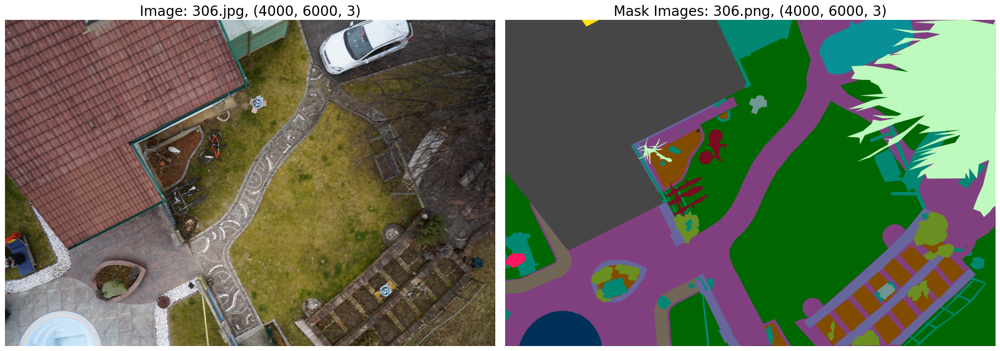

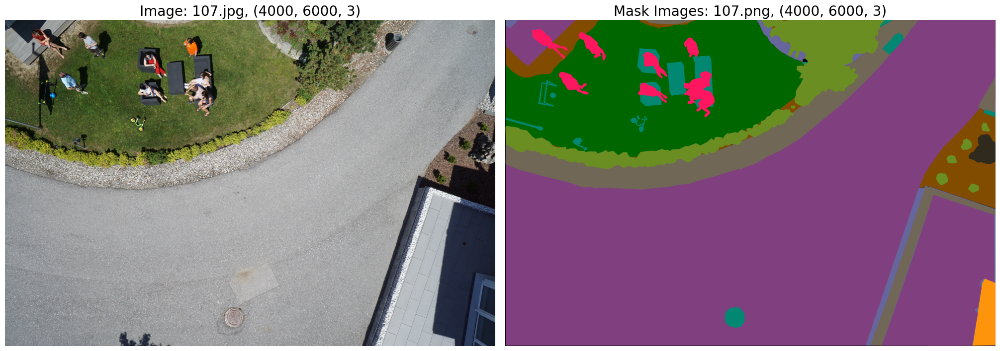

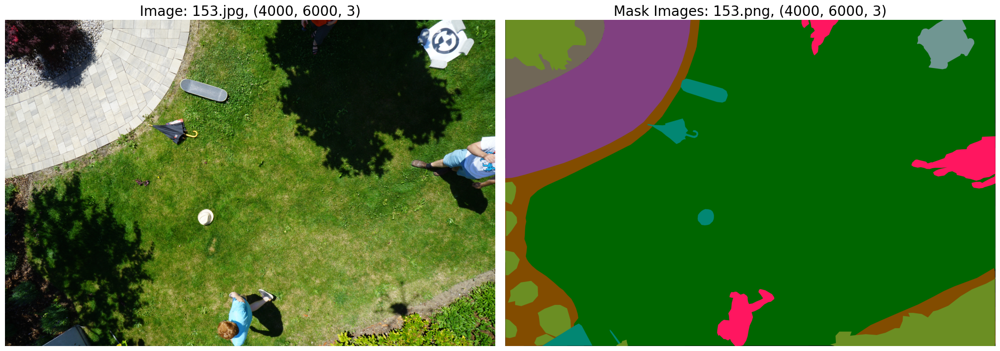

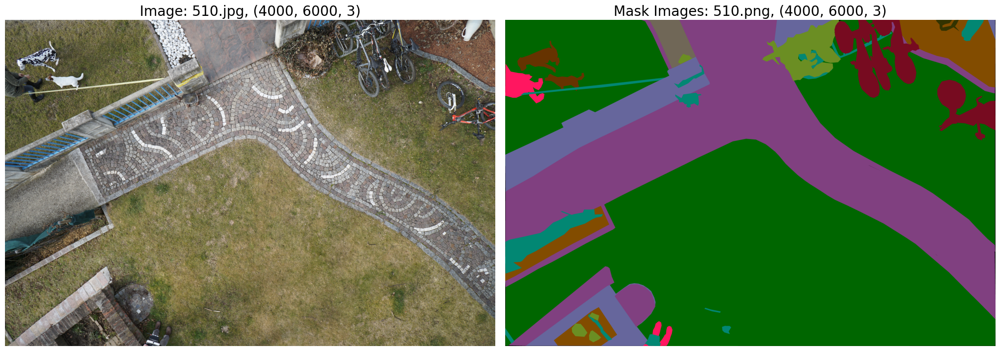

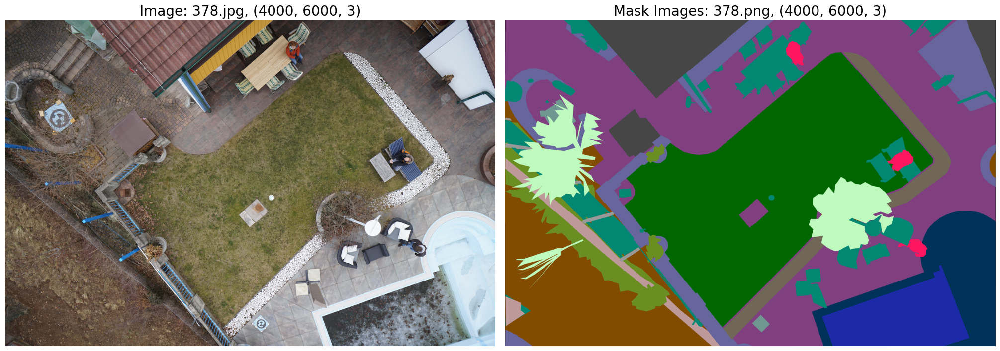

In [11]:
# Visualizing all the data
def visualize_semantic_dataset(image_list: list, mask_list: list, total_rows: int = 5):
    """
    Ploting Random data of images and masks.
    Parameters:
        image_list: A list containing the path of the images.
        mask_list: A list containing the path of the masks.
        total_rows: A int for ploting total number of images and masks.
    """
    # Randomely sampling the dataset and visualizing it
    for file_num in random.sample(range(min(len(image_list), len(mask_list))),
                                  k = total_rows):

        fig, axs = plt.subplots(nrows=1,
                                ncols=2,
                                figsize=(20, 10),
                                constrained_layout=True)

        # First column will display the images
        org_image = plt.imread(image_list[file_num])
        axs[0].imshow(org_image)
        axs[0].set_title(f'Image: {image_list[file_num].split("/")[-1]}, {org_image.shape}',
                         fontdict={'fontsize': 20})
        axs[0].grid(False)
        axs[0].axis(False)

        # Second column will display the mask images
        mask_image = plt.imread(mask_list[file_num])
        axs[1].imshow(mask_image)
        axs[1].set_title(f'Mask Images: {mask_list[file_num].split("/")[-1]}, {mask_image.shape}',
                         fontdict={'fontsize': 20})
        axs[1].grid(False)
        axs[1].axis(False)

        plt.show();

visualize_semantic_dataset(image_list=image_list,
                           mask_list=image_mask_list)

In [12]:
# Getting aspect ratio of the dataset
img_shape_list = np.array([[img for img in plt.imread(path).shape] for path in image_list])
img_shape_list[:5], img_shape_list.shape

(array([[4000, 6000,    3],
        [4000, 6000,    3],
        [4000, 6000,    3],
        [4000, 6000,    3],
        [4000, 6000,    3]]),
 (400, 3))

In [13]:
img_ratio = img_shape_list[:, 1] / img_shape_list[:, 0]
img_ratio[:5], np.mean(img_ratio), np.median(img_ratio)

(array([1.5, 1.5, 1.5, 1.5, 1.5]), 1.5, 1.5)

All the images have the same height and width.

Now understanding the classes distribution in the dataset.

In [14]:
# Extracting data from annotation files
meta_data_dict = {}

for i, file in enumerate(xml_annot_list):
    meta_data_dict[i] = {}
    try:
        root = ElementTree.parse(file).getroot()

        # Extracting data present in the object tag
        for j, obj in enumerate(root.findall('object')):

            # Extracting the class name of the object, each object has a single class name
            if obj.find('name').text != 'layer': # Layer class is empty
                meta_data_dict[i][f'obj_{j}'] = []
                meta_data_dict[i][f'obj_{j}'].append(obj.find('name').text)

                # Extracting polygon point coordinates
                for k, poly in enumerate(obj.findall('polygon')):
                    for pt in poly.findall('pt'):
                        meta_data_dict[i][f'obj_{j}'].append(float(pt.find('x').text))
                        meta_data_dict[i][f'obj_{j}'].append(float(pt.find('y').text))

    except Exception as e:
        print(f'Index {i}, received error "{e}" for file: "{file}".\n')

print(f'Total annotation successfully read and extracted: {len(meta_data_dict)}')
print(f'Reading the first meta data:\n{meta_data_dict[0]}')

Index 21, received error "could not convert string to float: 'undefined'" for file: "original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/035.xml".

Index 261, received error "not well-formed (invalid token): line 1, column 0" for file: "original_data/semantic_drone_dataset/training_set/gt/semantic/label_me_xml/389.xml".

Total annotation successfully read and extracted: 400
Reading the first meta data:
{'obj_0': ['paved-area', 625.0, -5.0, 4841.0, 5.0, 5613.0, 1044.0, 5977.0, 759.0, 5997.0, 745.0, 5995.0, 3995.0, 5.0, 3991.0, 5.0, 1356.0, 0.0, 1200.0, 156.0, 1062.0, 359.0, 768.0, 543.0, 382.0, 598.0, 129.0], 'obj_1': ['wall', 4831.0, 3.0, 5327.0, 674.0, 5431.0, 602.0, 5452.0, 609.0, 5970.0, 249.0, 6000.0, 232.0, 5997.0, 180.0, 5472.0, 548.0, 5456.0, 554.0, 5051.0, 1.0], 'obj_2': ['paved-area', 5286.0, 0.0, 5999.0, 1.0, 5998.0, 53.0, 5554.0, 366.0, 5307.0, 16.0], 'obj_3': ['gravel', 624.3410757291946, -1.7297832485951297, 587.5216606498195, 177.20036101083033, 560

In [15]:
# Getting the total count for the classes and creating a seperate dict for polygon coords
annot_class_list = []
annot_polygon_dict = {}

# Collecting all the object class names and polygon coords from the meta data dict
for obj in meta_data_dict.values():
    for obj_meta in obj.values():
        annot_class_list.append(obj_meta[0])
        annot_polygon_dict[obj_meta[0]] = []

# Creating a new dict for the polygons, where the keys are the class names
for obj in meta_data_dict.values():
    for obj_meta in obj.values():
        annot_polygon_dict[obj_meta[0]].append(obj_meta[1:])

# Comparing the length of polygon dict with class counter list
for classes, poly in sorted(annot_polygon_dict.items()):
    print(f'{classes}: {len(poly)}')
print('\n')

annot_class_counter = Counter(sorted(annot_class_list))
annot_class_counter

ar-marker: 253
bald-tree: 209
bicycle: 275
car: 121
dirt: 2832
dog: 37
door: 53
fence: 549
fence-pole: 937
grass: 508
gravel: 1354
obstacle: 7036
paved-area: 1955
person: 1568
pool: 39
rocks: 994
roof: 359
tree: 525
vegetation: 7307
wall: 1209
water: 116
window: 515




Counter({'ar-marker': 253,
         'bald-tree': 209,
         'bicycle': 275,
         'car': 121,
         'dirt': 2832,
         'dog': 37,
         'door': 53,
         'fence': 549,
         'fence-pole': 937,
         'grass': 508,
         'gravel': 1354,
         'obstacle': 7036,
         'paved-area': 1955,
         'person': 1568,
         'pool': 39,
         'rocks': 994,
         'roof': 359,
         'tree': 525,
         'vegetation': 7307,
         'wall': 1209,
         'water': 116,
         'window': 515})

In [16]:
# Getting the polygon area and central tendency for all the polygons
annot_contours_area = {}
annot_contours_area_median = {}

# Initialize a new dict for all the classes and polygon area
for c, poly in annot_polygon_dict.items():
    annot_contours_area[c] = []

# Calculating the area for each polygon
for c, poly in annot_polygon_dict.items():
    for pts in poly:
        annot_contours_area[c].append(cv2.contourArea(np.reshape(pts, (-1, 1, 2)).astype(np.int32)))

# Calculating the median for all the classes
for c, poly in sorted(annot_contours_area.items()):
    annot_contours_area_median[c] = np.median(poly)

annot_contours_area_median

{'ar-marker': 43139.0,
 'bald-tree': 244856.5,
 'bicycle': 38323.0,
 'car': 362781.0,
 'dirt': 11412.25,
 'dog': 33794.5,
 'door': 38520.5,
 'fence': 120688.5,
 'fence-pole': 2843.0,
 'grass': 1759986.5,
 'gravel': 248646.25,
 'obstacle': 15718.5,
 'paved-area': 96365.5,
 'person': 32365.0,
 'pool': 2231160.0,
 'rocks': 22209.5,
 'roof': 1222023.5,
 'tree': 128540.0,
 'vegetation': 12501.0,
 'wall': 135557.0,
 'water': 1205235.0,
 'window': 43666.0}

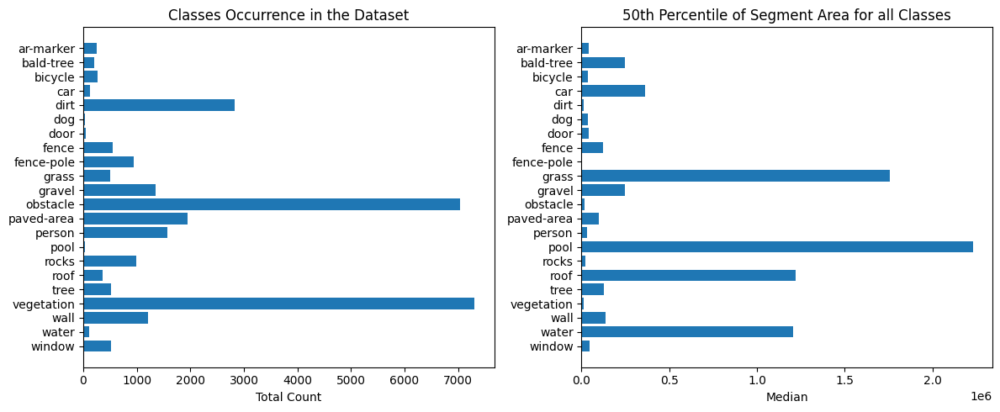

In [17]:
# Plotting the classes counter to check total count for each class
plt.figure(figsize=(12, 5))

plt.subplot(121)
plt.barh(list(annot_class_counter.keys()), list(annot_class_counter.values()))
plt.gca().invert_yaxis()
plt.xlabel('Total Count')
plt.title('Classes Occurrence in the Dataset')

plt.subplot(122)
plt.barh(list(annot_contours_area_median.keys()), list(annot_contours_area_median.values()))
plt.gca().invert_yaxis()
plt.xlabel('Median')
plt.title('50th Percentile of Segment Area for all Classes')

plt.tight_layout();

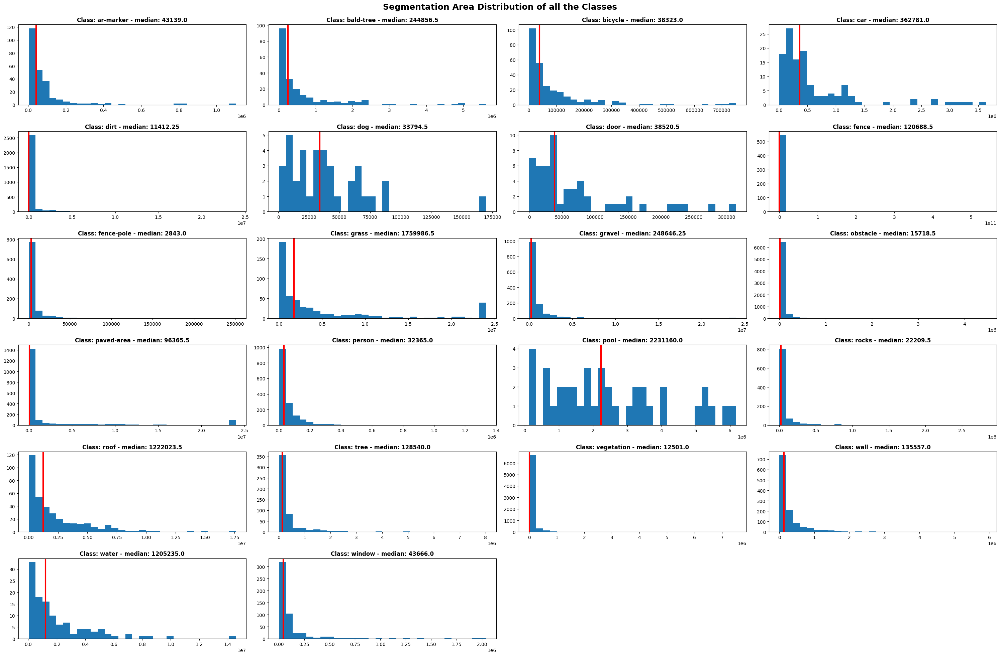

In [18]:
# Plotting the distribution for all the polygon areas for each classes
plt.figure(figsize=(30, 20))
plt.suptitle('Segmentation Area Distribution of all the Classes\n',
             fontsize=18,
             fontweight='bold')

for i, classes in enumerate(sorted(annot_contours_area)):
    plt.subplot(6, 4, i+1)
    plt.hist(annot_contours_area[classes], bins=30)
    plt.axvline(annot_contours_area_median[classes], color='r', linewidth=3)
    plt.title(f'Class: {classes} - median: {annot_contours_area_median[classes]}', fontweight='bold')

plt.tight_layout();

## Offline Data Augmentation

There are in total 400 images in the dataset, I will be splitting the dataset into training and validation/testing set. The ratio of the split will be 75 percent(300 images) for train set and 25 percent(100 images) for the val/test set.

In Deep Learning one of the important factor is the data, in this dataset the quantity of the dataset is quite small which can lead to poor result after training the model. So, one of the ways to increase the dataset is by using augmentation, I will be augmenting the training set to a additional 2x quantity which will give me a total of 900 images for the training set and I will be making no changes to the val/test set keeping the same size(100 images) of original data.

Following augmentation techniques will be applied to the training dataset:

**Spatial-Level Transforms:**
* Horizontal Flipping
* Vertical Flipping
* Random Cropping
* Rotate
* Grid Distortion
* Optical Distortion

**Pixel-Level Transforms:**
* CLAHE - Contrast Limited Adaptive Histogram Equalization
* Random Brightness
* Random Contrast
* Random Gamma

In [19]:
dataset_dir = 'train_val_dataset'

train_dir = os.path.join(dataset_dir, 'train')
train_images_dir = os.path.join(train_dir, 'images')
train_masks_dir = os.path.join(train_dir, 'masks')

val_dir = os.path.join(dataset_dir, 'val')
val_images_dir = os.path.join(val_dir, 'images')
val_masks_dir = os.path.join(val_dir, 'masks')

In [20]:
# Creating training and validation split directories and randomly
for path in [train_images_dir, train_masks_dir, val_images_dir, val_masks_dir]:
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path)

# Zipping image and mask path and shuffling the list
random.seed(42)
path_list = list(zip(image_list, image_mask_list))
random.shuffle(path_list)

train_size = int(len(image_list) * 0.75)

# Moving the images and mask images in their split directory.
for i, (img_path, mask_path) in tqdm(enumerate(path_list), total=len(path_list)):
    if not img_path.split('/')[-1].split('.')[0] == mask_path.split('/')[-1].split('.')[0]:
        print(f'[ERROR] Image and Mask file do not match, check the path list at index {i}.')
        break

    if i < train_size:
        if os.path.isfile(img_path) and os.path.isfile(mask_path):
            shutil.copy2(img_path, train_images_dir)
            shutil.copy2(mask_path, train_masks_dir)
        else:
            print(f'[ERROR] File does not exist: {img_path} and {mask_path}')

    elif i >= train_size:
        if os.path.isfile(img_path) and os.path.isfile(mask_path):
            shutil.copy2(img_path, val_images_dir)
            shutil.copy2(mask_path, val_masks_dir)
        else:
            print(f'[Error] File does not exist: {img_path} and {mask_path}')

print('[INFO]: Dataset is been splitted into train and val directory.')

  0%|          | 0/400 [00:00<?, ?it/s]

[INFO]: Dataset is been splitted into train and val directory.


In [21]:
train_img_list = sorted(glob.glob(os.path.join(train_images_dir, '*')))
train_mask_list = sorted(glob.glob(os.path.join(train_masks_dir, '*')))
val_img_list = sorted(glob.glob(os.path.join(val_images_dir, '*')))
val_mask_list = sorted(glob.glob(os.path.join(val_masks_dir, '*')))

len(train_img_list), len(train_mask_list), len(val_img_list), len(val_mask_list)

(300, 300, 100, 100)

In [22]:
for path in [train_img_list, train_mask_list, val_img_list, val_mask_list]:
    print(path[50:55])

['train_val_dataset/train/images/109.jpg', 'train_val_dataset/train/images/110.jpg', 'train_val_dataset/train/images/112.jpg', 'train_val_dataset/train/images/113.jpg', 'train_val_dataset/train/images/116.jpg']
['train_val_dataset/train/masks/109.png', 'train_val_dataset/train/masks/110.png', 'train_val_dataset/train/masks/112.png', 'train_val_dataset/train/masks/113.png', 'train_val_dataset/train/masks/116.png']
['train_val_dataset/val/images/265.jpg', 'train_val_dataset/val/images/266.jpg', 'train_val_dataset/val/images/273.jpg', 'train_val_dataset/val/images/281.jpg', 'train_val_dataset/val/images/283.jpg']
['train_val_dataset/val/masks/265.png', 'train_val_dataset/val/masks/266.png', 'train_val_dataset/val/masks/273.png', 'train_val_dataset/val/masks/281.png', 'train_val_dataset/val/masks/283.png']


In [23]:
# Creating a data augmentation compose for transforming the data
aug_transform = A.Compose([
    A.RandomSizedCrop(min_max_height=(3500, 4000), height=4000, width=6000, w2h_ratio=1.5, p=0.8),
    A.VerticalFlip(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=(45, 225), interpolation=cv2.INTER_NEAREST, p=0.8),
    A.OneOf([
        A.GridDistortion(interpolation=cv2.INTER_NEAREST, p=0.5),
        A.OpticalDistortion(distort_limit=1, shift_limit=0.5, interpolation=cv2.INTER_NEAREST, p=0.5)
    ], p=0.8),
    A.CLAHE(p=0.5),
    A.RandomGamma(p=0.5),
    A.RandomBrightnessContrast(p=1.0)
], p=1.0)

train_aug_img_dir = os.path.join(train_dir, 'org_aug_images')
train_aug_mask_dir = os.path.join(train_dir, 'org_aug_masks')

In [24]:
# Performing augmentation on the training data and saving it in the split directory
def augment_dataset(images_list: list,
                    masks_list: list,
                    aug_transform: A.Compose,
                    img_output_dir: str,
                    mask_output_dir: str,
                    batch_num: int,
                    pbar):
    # Generating augment data using the compose function
    for img_path, mask_path in zip(sorted(images_list),
                                   sorted(masks_list)):

        # Reading and transforming the image and mask
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)
        transformed = aug_transform(image=image, mask=mask)

        # Saving the images in the directory
        img_filename = img_path.split('/')[-1]
        cv2.imwrite(os.path.join(img_output_dir,
                                 f'aug_{batch_num + 1}_{img_filename}'),
                    cv2.cvtColor(transformed['image'],
                                 cv2.COLOR_BGR2RGB))

        mask_filename = mask_path.split('/')[-1]
        cv2.imwrite(os.path.join(mask_output_dir,
                                 f'aug_{batch_num + 1}_{mask_filename}'),
                    cv2.cvtColor(transformed['mask'],
                                 cv2.COLOR_BGR2RGB))
        pbar.update(1)

def generate_augment_batch(images_list: list,
                           masks_list: list,
                           aug_transform: A.Compose,
                           img_output_dir: str,
                           mask_output_dir: str,
                           total_batch: int,
                           copy_original: bool = True):
    """
    Function to generate offline augment dataset for n number of batches.
    Parameters:
        images_list: A list containing the path of the images.
        masks_list: A list containing the path of the masks.
        aug_transform: A transformation compose build using the albumentations
                       library.
        img_output_dir: A string providing the directory location to save the
                        augment images.
        mask_output_dir: A string providing the directory location to save the
                        augment masks.
        total_batch: A int for generating total batches of augment data from the
                     original dataset.
        copy_original(default=True): A bool to whether copy the original dataset
                                     along with the augment dataset.
    """
    # Checking and creating the path for the dataset
    for path in [img_output_dir, mask_output_dir]:
        if os.path.exists(path):
            shutil.rmtree(path)
        os.makedirs(path)

    with tqdm(total=len(images_list) * total_batch) as pbar:
        # Calling the augment dataset function and creating batches of data
        if total_batch > 1:
            Parallel(n_jobs=os.cpu_count(),
                     prefer='threads',
                     verbose=13)(delayed(augment_dataset)(images_list,
                                                          masks_list,
                                                          aug_transform,
                                                          img_output_dir,
                                                          mask_output_dir,
                                                          num,
                                                          pbar) for num in range(total_batch))
        else:
            [augment_dataset(images_list,
                             masks_list,
                             aug_transform,
                             img_output_dir,
                             mask_output_dir,
                             num,
                             pbar) for num in range(total_batch)]
    print('[INFO] Augment data has been generated')
    print(f'[INFO] Augment images and masks are in the directory: "{img_output_dir}" and "{mask_output_dir}"')

    # Copying the original dataset in the augment dataset directory
    if copy_original:
        for img_path, mask_path in zip(sorted(images_list),
                                       sorted(masks_list)):
            shutil.copy2(img_path, img_output_dir)
            shutil.copy2(mask_path, mask_output_dir)
        print('[INFO] Original data has been copied in the output directory.')

In [ ]:
# Using the function to generate training dataset
generate_augment_batch(images_list=train_img_list,
                       masks_list=train_mask_list,
                       aug_transform=aug_transform,
                       img_output_dir=train_aug_img_dir,
                       mask_output_dir=train_aug_mask_dir,
                       total_batch=2)

  0%|          | 0/600 [00:00<?, ?it/s]

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed: 27.3min
[Parallel(n_jobs=2)]: Done   2 out of   2 | elapsed: 27.3min finished


[INFO] Augment data has been generated
[INFO] Augment images and masks are in the directory: "train_val_dataset/train/org_aug_images" and "train_val_dataset/train/org_aug_masks"
[INFO] Original data has been copied in the output directory.


In [ ]:
# Getting the filenames of the original images
filenames = []
for path in train_img_list:
    filenames.append(path.split('/')[-1].split('.')[0])
filenames[50:55], len(filenames)

(['109', '110', '112', '113', '116'], 300)

In [ ]:
def visualize_augment_dataset(filenames_list: list,
                              img_ext: str,
                              mask_ext: str,
                              image_dir: str,
                              mask_dir: str,
                              batch_count: int = 5):
    """
    A function to plot the generated offline augment dataset.
    Parameters:
        filenames_list: A list containing the names of the files, the name needs
                        to be same for both the images and masks.
        img_ext: A str mentioning the images file extension.
        mask_ext: A str mentioning the masks file extension.
        image_dir: A str providing the location of the directory where the images
                   are stored.
        mask_dir: A str providing the location of the directory where the masks
                   are stored.
        batch_count(default=5): A int for displaying the generated augment data.
    """
    # Ploting all the images and mask from the list
    for filename in filenames_list:
        fig, axs = plt.subplots(2, batch_count+1,
                                figsize=(22, 8),
                                constrained_layout=True)
        fig.suptitle(f'Comparison of Original and Augmented Images with Masks for file: {filename}',
                     fontsize=20,
                     fontweight='bold')

        # Selecting augmented images as per the total batch count
        # Where the first one is original and the rest is augmented.
        for i in range(batch_count+1):

            # Visualizing the original images and mask
            if i == 0:
                # Original images
                axs[0, i].imshow(Image.open(os.path.join(image_dir,
                                                         filename + img_ext)))
                axs[0, i].set_title(f'Original Image: {filename + img_ext}',
                                    fontdict={'fontsize': 18})
                axs[0, i].axis(False)
                axs[0, i].grid(False)

                # Original mask
                axs[1, i].imshow(Image.open(os.path.join(mask_dir,
                                                         filename + mask_ext)))
                axs[1, i].set_title(f'Original Image: {filename + mask_ext}',
                                    fontdict={'fontsize': 18})
                axs[1, i].axis(False)
                axs[1, i].grid(False)

            # Visualizing the augment images and mask
            else:
                # Augmented images
                axs[0, i].imshow(Image.open(os.path.join(image_dir,
                                                         f'aug_{i}_{filename + img_ext}')))
                axs[0, i].set_title(f'Augmented Image: {filename + img_ext}',
                                    fontdict={'fontsize': 18})
                axs[0, i].axis(False)
                axs[0, i].grid(False)

                # Augmented mask
                axs[1, i].imshow(Image.open(os.path.join(mask_dir,
                                                         f'aug_{i}_{filename + mask_ext}')))
                axs[1, i].set_title(f'Augmented Image: {filename + mask_ext}',
                                    fontdict={'fontsize': 18})
                axs[1, i].axis(False)
                axs[1, i].grid(False)

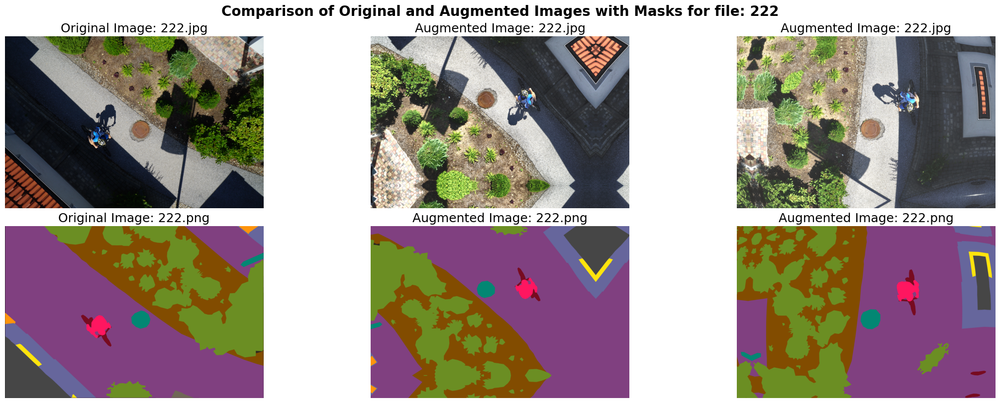

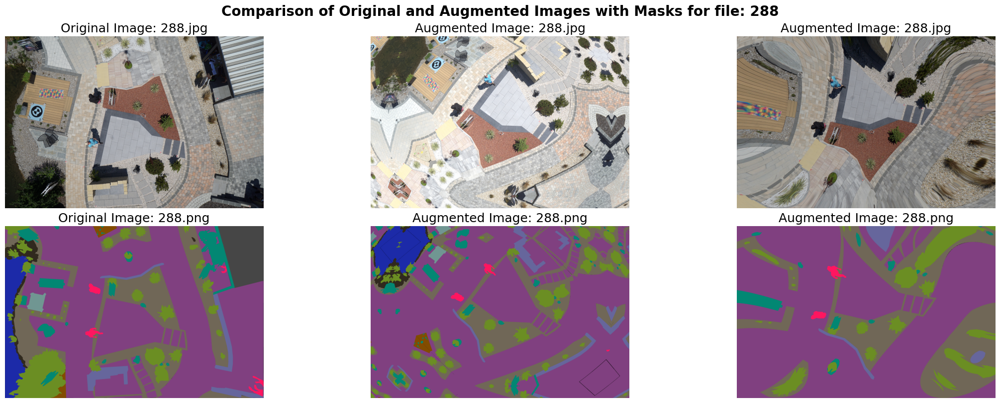

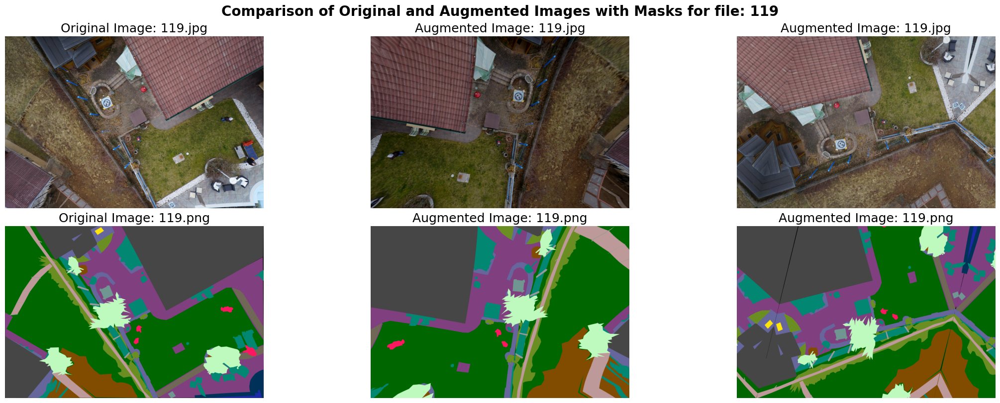

In [ ]:
# Random sample for visualizing
rand_filenames = random.sample(filenames, k=3)

visualize_augment_dataset(filenames_list=rand_filenames,
                          img_ext='.jpg',
                          mask_ext='.png',
                          image_dir=train_aug_img_dir,
                          mask_dir=train_aug_mask_dir,
                          batch_count=2)

## Model Development

Now that we have enough data to work on, we can proceed with the next step that is to define and build the model for performing the semantic segmentation.

Reading the title of the project you might have known the model we will be building that is U-Net segmentation model. We will be building it using the PyTorch library, you can also read the research paper on arxiv, link over [here](https://arxiv.org/abs/1505.04597).

![](https://production-media.paperswithcode.com/tasks/c8b56ae4-47ef-42d7-b651-9745c90911ba.jpg)

The model architecture looks like a U shape, where the first half is for contracting path or downsampling and the other half is for expansive path or upsampling.

During replicating the model, there is will some minor changes in our model compared to the model described in the paper.

1. While performing 2d convolution, we will using 1 padding to keep the spatial dimension same, while in the orginal model they have not used any padding, this results in change of dimension.

2. while performing upsampling, it is mentioned that they used UpSample method, but we will be using 2d transposed convolution.

3. Doing the above changes generates perdiction tensor similar to the input size, which means no extra processing is needed, that were done in the original model.



In [2]:
# Defining the parts of the architecture
class DoubleConvLayer(nn.Module):
    """
    Creates two convolution layers with batch normalization
    and relu activation.
    This convoluton layers do not change the spatial dimension
    and only affects the feature dimension.
    If you check the architecture dig., this class creates the
    layer indicated by the blue arrow.
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            # First convolution layer
            nn.Conv2d(in_channels=in_channels,
                      out_channels=out_channels,
                      kernel_size=3,
                      stride=1,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True),

            # Second convolution layer
            nn.Conv2d(in_channels=out_channels,
                      out_channels=out_channels,
                      kernel_size=3,
                      stride=1,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class DownSampling(nn.Module):
    """
    This class implements the downsampling part of the architecture.
    If you check the architecture dig., the left path displays the red arrow
    indicating the downsampled layer using max pool.
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.down_sample = nn.Sequential(
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Initializing the layer using the double convolution layer class
            DoubleConvLayer(in_channels=in_channels,
                            out_channels=out_channels)
        )

    def forward(self, x):
        return self.down_sample(x)

class UpSampling(nn.Module):
    """
    This class implements the upsampling part of the architecture.
    If you check the architecture dig., the right path displays the green arrow
    indicating the upsampled layer.
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()
        # Using Transposed convolution for upsampling
        self.up_sample = nn.ConvTranspose2d(in_channels=in_channels,
                                            out_channels=out_channels,
                                            kernel_size=2,
                                            stride=2)
        self.double_conv = DoubleConvLayer(in_channels=in_channels,
                                           out_channels=out_channels)

    def forward(self, x1, x2):
        """
        x1 is the output tensor of the previous layer, which will be upsampled.
        x2 is the skip connection tensor that was generated durning
        downsampling.
        """
        x1 = self.up_sample(x1)

        # Correcting the shape after upsampling
        if x1.shape != x2.shape:
            x1 = TF.resize(img=x1, size=x2.shape[2:], antialias=True)

        x = torch.cat((x2, x1), 1)
        return self.double_conv(x)

In [3]:
# Defining the complete unet architecture using the parts defined above
class UnetModel(nn.Module):
    def __init__(self,
                 n_classes: int,
                 in_channels=3):
        super().__init__()
        features = [64, 128, 256]
        self.encoder = nn.ModuleList()
        self.decoder = nn.ModuleList()
        self.skip_connection = []

        # The input layer of the model [BCHW]
        # Eg. input tensor shape: [1, 3, 572, 572]
        self.encoder.append(DoubleConvLayer(in_channels=in_channels,
                                            out_channels=features[0]))
        # Eg. output tensor shape: [1, 64, 572, 572]

        # A 3 layer downsampling
        # Eg. input tensor shape: [1, 64, 572, 572]
        for feature in features:
            self.encoder.append(DownSampling(in_channels=feature,
                                             out_channels=feature * 2))
        # Eg. output tensor shape: [1, 512, 71, 71]

        # Bottom layer of the UNet Model
        # Eg. input tensor shape: [1, 512, 71, 71]
        self.bottom_layer = DownSampling(in_channels=features[-1]*2,
                                         out_channels=features[-1]*4)
        # Eg. output tensor shape: [1, 1024, 35, 35]

        # A 3 layer upsampling
        # Eg. input tensor shape: [1, 1024, 35, 35]
        for feature in reversed(features):
            self.decoder.append(UpSampling(in_channels=feature * 4,
                                           out_channels=feature * 2))
        # Eg. output tensor shape: [1, 128, 286, 286]

        # Up sampling before the final layer
        # Eg. input tensor shape: [1, 128, 286, 286]
        self.decoder.append(UpSampling(in_channels=features[1],
                                       out_channels=features[0]))
        # Eg. output tensor shape: [1, 64, 572, 572]

        # Final layer of the model, giving the predicted mask
        # Eg. input tensor shape: [1, 64, 572, 572]
        self.final_layer = nn.Conv2d(in_channels=features[0],
                                     out_channels=n_classes,
                                     kernel_size=1)
        # Eg. output tensor shape: [1, n_classes, 572, 572]

    def forward(self, x):
        for encode in self.encoder:
            x = encode(x)
            # Appending all the downsampled output for skip connection
            self.skip_connection.append(x)

        x = self.bottom_layer(x)

        for decode, skip in zip(self.decoder,
                                reversed(self.skip_connection)):
            # Upsampling using the skip connection that was collected durning downsampling
            x = decode(x, skip)

        return self.final_layer(x)

In [ ]:
# Performing a unit test to check whether the model works or not
x = torch.randn((3, 3, 224, 224))
model = UnetModel(n_classes=5, in_channels=3)
output = model(x)
assert x.shape[2:] == output.shape[2:]
print(f'Input shape: {x.shape} and output shape: {output.shape}')

Input shape: torch.Size([3, 3, 224, 224]) and output shape: torch.Size([3, 5, 224, 224])


In [ ]:
# Summary of the model
summary(model=UnetModel(n_classes=5),
        input_size=(1, 3, 224, 224),
        col_names=['input_size', 'output_size', 'num_params', 'trainable'],
        col_width=20,
        row_settings=['var_names'])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
UnetModel (UnetModel)                              [1, 3, 224, 224]     [1, 5, 224, 224]     --                   True
├─ModuleList (encoder)                             --                   --                   --                   True
│    └─DoubleConvLayer (0)                         [1, 3, 224, 224]     [1, 64, 224, 224]    --                   True
│    │    └─Sequential (double_conv)               [1, 3, 224, 224]     [1, 64, 224, 224]    38,848               True
│    └─DownSampling (1)                            [1, 64, 224, 224]    [1, 128, 112, 112]   --                   True
│    │    └─Sequential (down_sample)               [1, 64, 224, 224]    [1, 128, 112, 112]   221,696              True
│    └─DownSampling (2)                            [1, 128, 112, 112]   [1, 256, 56, 56]     --                   True
│    │    └─Sequential (down_sample)       

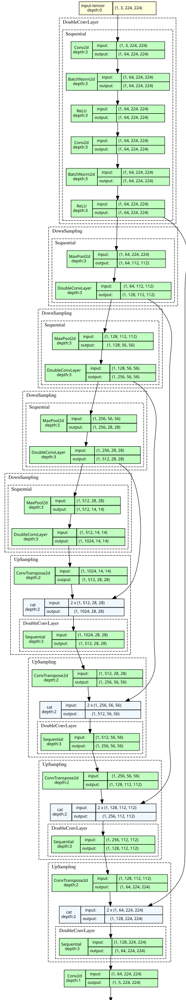

In [ ]:
# Visualizing the model
model_graph = draw_graph(UnetModel(5), input_size=(1,3,224,224), expand_nested=True)
model_graph.visual_graph

## Dataset and DataLoader Preparation

Now that we have the data and model ready to work on, we can proceed with the next step, that is data preparation, here we will build our dataset that can be feeded into the model, this will be done using the PyTorch dataset generating and loading method.

In [4]:
# Getting the mask colors for all the classes from the csv file
classes_csvpath = 'original_data/semantic_drone_dataset/training_set/gt/semantic/class_dict.csv'
classes_colormap = {}
classes = []

with open(classes_csvpath, 'r') as file:
    reader = csv.DictReader(file)
    for i, data in enumerate(reader):
        classes_colormap[data['name']] = ((int(data[' r']),
                                           int(data[' g']),
                                           int(data[' b'])))
        classes.append(data['name'])
print('Classes:\n', classes, '\nColormap:\n', classes_colormap, '\nClasses length:', len(classes))

Classes:
 ['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting'] 
Colormap:
 {'unlabeled': (0, 0, 0), 'paved-area': (128, 64, 128), 'dirt': (130, 76, 0), 'grass': (0, 102, 0), 'gravel': (112, 103, 87), 'water': (28, 42, 168), 'rocks': (48, 41, 30), 'pool': (0, 50, 89), 'vegetation': (107, 142, 35), 'roof': (70, 70, 70), 'wall': (102, 102, 156), 'window': (254, 228, 12), 'door': (254, 148, 12), 'fence': (190, 153, 153), 'fence-pole': (153, 153, 153), 'person': (255, 22, 96), 'dog': (102, 51, 0), 'car': (9, 143, 150), 'bicycle': (119, 11, 32), 'tree': (51, 51, 0), 'bald-tree': (190, 250, 190), 'ar-marker': (112, 150, 146), 'obstacle': (2, 135, 115), 'conflicting': (255, 0, 0)} 
Classes length: 24


In [5]:
# Creating the dataset class
class DroneDataset(Dataset):
    """
    """
    def __init__(self,
                 img_dir: str,
                 mask_dir: str,
                 colormap: list,
                 limit: int = 0,
                 transform=None):
        assert limit >= 0 and limit <= 100
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.colormap = colormap
        self.transform = transform
        self.limit = limit / 100

        # Getting all the path of images and masks
        self.path_list = os.listdir(img_dir)
        self.limit = round(self.limit * len(self.path_list))
        self.path_list = random.sample(self.path_list, k=self.limit)

    def rgbmask_to_label(self,
                         rgb_mask: np.ndarray,
                         colormap: list):
        """
        Converts a single RGB masks into onehot encoding masks and finally
        creates a single channel class index label.
        Parameters:
            rgb_mask: A array containing the mask in RGB format and shape (HWC).
            colormap: A list with all the RGB colors for every single class
                      in proper sequence.
        Returns:
            output: A array that is converted from RGB mask to label encoded in
                    shape (H x W).
        """
        # A array to fill the output later.
        output = np.zeros(rgb_mask.shape[:2])

        for label, color in enumerate(colormap):
            if label < len(colormap):
                # Matching the mask with the colormap
                # Then replacing with classes index
                output[np.all(np.equal(rgb_mask, color), axis=-1)] = label

        return output

    def __len__(self):
        return len(self.path_list)

    def __getitem__(self, index):
        # Getting the path of image and mask
        image_path = os.path.join(self.img_dir, self.path_list[index])
        mask_path = os.path.join(self.mask_dir,
                                 self.path_list[index].replace('.jpg',
                                                                   '.png'))

        # Reading the image and mask file in RGB format
        image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

        # Transforming the image and masks using augmentation
        if self.transform is not None:
            aug = self.transform(image=image, mask=mask)
            image = aug['image']
            mask = aug['mask']

        # Transforming the mask into label encoded format
        mask = (mask.detach().numpy() if type(mask) == torch.Tensor else mask)
        mask = self.rgbmask_to_label(rgb_mask=mask,
                                     colormap=self.colormap)
        mask = torch.from_numpy(mask).type(torch.LongTensor)
        return image, mask

In [ ]:
dataset = DroneDataset(img_dir=train_aug_img_dir,
                       mask_dir=train_aug_mask_dir,
                       colormap=classes_colormap.values(),
                       transform=None)

Size of the dataset: 900
Shape of Image: (4000, 6000, 3) and mask: torch.Size([4000, 6000])
Classes in the mask images: [ 0  1  3  4  5  7 10 15 20 22]

Plotting the data:


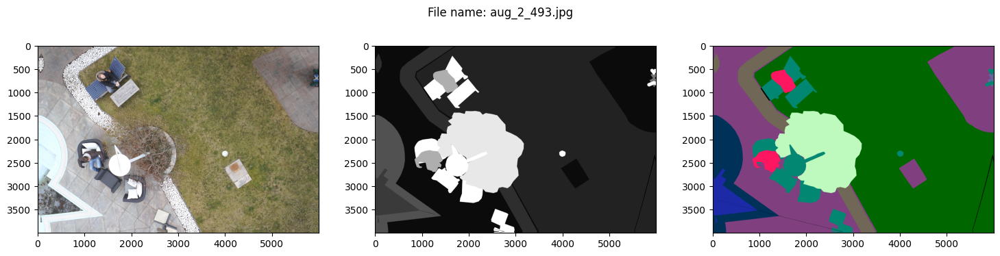

In [ ]:
# Testing the PyTorch dataset class on random index
rand_num = np.random.randint(len(dataset))
image, mask = dataset[rand_num]

print(f'Size of the dataset: {len(dataset)}')
print(f'Shape of Image: {image.shape} and mask: {mask.shape}')
print(f'Classes in the mask images: {np.unique(mask)}')
print('\nPlotting the data:')

filename = dataset.filename_list[rand_num]
plt.figure(figsize=(18, 4))
plt.suptitle(f'File name: {filename}')
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(mask, 'gray')
plt.subplot(133)
plt.imshow(plt.imread(os.path.join(dataset.mask_dir,
                                   filename.replace('.jpg', '.png'))));

In [6]:
# Building a function that creates and provides dataloaders
def get_dataloaders(img_dir: str,
                    mask_dir: str,
                    colormap: list,
                    batch_size: int,
                    num_workers: int,
                    limit: int = 0,
                    transform = None,
                    shuffle: bool = True,
                    pin_memory: bool = True):
    """
    Function to create pytorch dataloaders for segmentation task
    Parameters:
        img_dir: A string for the images directory.
        mask_dir: A string for the masks directory.
        colormap: A list containing the classes to color mapping in order.
        batch_size: A unsigned int for the batch size.
        num_workers: A unsigned int for the worker size.
        transform: A transform for augmenting the dataset.
        shuffle: A boolean for whether to shuffle the dataset.
        pin_memory: A boolean to whether access the pin memory of GPU for
                    faster loading of dataset.
    Returns:
        dataloader: A pytorch dataloader using the provided images and masks.
    """
    assert batch_size > 0 and num_workers > 0
    assert limit >= 0 and limit <= 100
    # Getting the dataset
    dataset = DroneDataset(img_dir=img_dir,
                           mask_dir=mask_dir,
                           colormap=colormap,
                           limit=limit,
                           transform=transform)

    # Creating dataloaders
    dataloader = DataLoader(dataset=dataset,
                            batch_size=batch_size,
                            shuffle=shuffle,
                            num_workers=num_workers,
                            pin_memory=pin_memory,
                            drop_last=True)

    return dataloader

## Model Training

Now, that we have the model and dataset ready, we can fit the dataset in the model and train the model.

Note - While getting the dataset, we have an option to perform online augmentation on the data, in this case we will be performing resize, normalization and changing the format to a PyTorch tensor, our dataset contains original and augmented images already any more augmentation can give us an unexpected result.

In [7]:
# Creating the transform for the dataset
def train_transform(img_height: int,
                    img_width: int,
                    norm_mean: list,
                    norm_std: list):
    """
    Transforming the dataset while training the model
    Parameters:
        img_height (int): A int to reshape the height of the image
        img_width (int): A int to reshape the width of the image
        norm_mean (list): A list containg three values to normalize RGB image
                          at the mean level
        norm_std (list): A list containg three values to normalize RGB image
                         at the standard deviation level
    Returns (A.Compose): A transform composed using the albumentations
    """
    return A.Compose([
        A.Resize(img_height, img_width, cv2.INTER_AREA),
        A.VerticalFlip(p=0.5),
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=(45, 225), interpolation=cv2.INTER_NEAREST, p=0.8),
        A.RandomBrightnessContrast(p=1.0),
        A.Normalize(mean=norm_mean,
                    std=norm_std),
        ToTensorV2()
        ])

def test_transform(img_height: int,
                   img_width: int,
                   norm_mean: list,
                   norm_std: list):
    """
    Transforming the dataset while Validation/testing the model
    Parameters:
        img_height (int): A int to reshape the height of the image
        img_width (int): A int to reshape the width of the image
        norm_mean (list): A list containg three values to normalize RGB image
                          at the mean level
        norm_std (list): A list containg three values to normalize RGB image
                         at the standard deviation level
    Returns (A.Compose): A transform composed using the albumentations
    """
    return A.Compose([
        A.Resize(img_height, img_width, cv2.INTER_AREA),
        A.Normalize(mean=norm_mean,
                    std=norm_std),
        ToTensorV2()
        ])

In [8]:
# Creating a function to calculate accuracy and DICE metrics while training the model
def calculate_accuracy(pred: torch.Tensor,
                       target: torch.Tensor):
    """
    Calculate multi-class accuracy for the provided tensor while training the
    model
    Parameters:
        pred (torch.Tensor): Raw logits produced by the model, the shape of
                             the tensor needs to be (B,C,H,W).
        target (torch.Tensor): A ground truth tensor, that is label encoded of
                               shape (B,H,W).
    Returns: Accuracy score
    """
    assert len(pred.shape) == 4 and len(target.shape) == 3
    pred = nn.Softmax2d()(pred).argmax(1).int()
    target = target.int()
    return ((pred == target).sum() / torch.numel(target)).item()

def calculate_iou_dice(pred: torch.Tensor,
                       target: torch.Tensor,
                       n_classes: int):
    """
    Calculate multi-class DICE and IoU score for the provided tensor while
    training the model
    Parameters:
        pred (torch.Tensor): Raw logits produced by the model, the shape of
                             the tensor needs to be (B,C,H,W).
        target (torch.Tensor): A ground truth tensor, that is label encoded of
                               shape (B,H,W).
        n_classes (int): Total number of classes
    Returns:
        iou_array (numpy.ndarray): A array with iou score for all the classes.
        iou_mean (float): A average iou score.
        dice_array (numpy.ndarray): A array with dice score for all the classes.
        dice_mean (float): A average dice score.
    """
    assert len(pred.shape) == 4 and len(target.shape) == 3
    assert pred.shape[1] == n_classes
    dice_array = []
    iou_array = []

    # Getting the predicted labels for every pixel
    # Flattening both the predicted and groundtruth tensor
    pred = nn.Softmax2d()(pred).argmax(dim=1).view(-1)
    target = target.view(-1)

    # Looping through the data for each class and
    # calculating the DICE and Iou score
    for class_idx in range(n_classes):

        # Creating a tensor for matching classes
        pred_inds = pred == class_idx
        target_inds = target == class_idx

        # Calculating the IoU score
        intersection = (pred_inds[target_inds]).long().sum().item()
        union = pred_inds.long().sum().item() \
                + target_inds.long().sum().item() - intersection

        # Stopping the zero error for division
        if union == 0:
            iou = 0
            iou_array.append(iou)
            dice_array.append(iou)
        else:
            iou = intersection / union
            iou_array.append(iou)

            # Calculating the dice score
            dice = (2 * iou) / (iou + 1)
            dice_array.append(dice)

    # Getting the average of both the scores
    iou_mean = np.mean(iou_array)
    dice_mean = np.mean(dice_array)

    return (np.array(iou_array), iou_mean,
            np.array(dice_array), dice_mean)

In [9]:
# Function for saving and loading model checkpoint
def save_model_checkpoint(model,
                          optimizer,
                          dir_path='model',
                          filename: str = 'model_checkpoint.pth'):
    """
    A function to save the model and optimizers state.
    Parameters:
        model: A pytorch model that needs to be saved.
        optimizer: A pytorch optimizer that needs to be saved.
        dir_path: A string for the directory path to save the model.
        filename: A string for the filename, extension needs to be ".pt" or ".pth".
    """
    assert filename.split('.')[-1] in ['pt', 'pth'], \
           '[ERROR] filename extension must be either "pt" or "pth".'

    if not os.path.exists(dir_path):
        os.makedirs(dir_path)

    obj_dict = {'model_state_dict': model.state_dict(),
                'optim_state_dict': optimizer.state_dict()}
    torch.save(obj_dict, os.path.join(dir_path, filename))

    print(f'[INFO] Checkpoint has been saved to the location:' \
          f'"{os.path.join(dir_path, filename)}".')

def load_model_checkpoint(model,
                          checkpoint_filepath: str = 'model_checkpoint.pth',
                          device=None):
    """
    A function to load the model state into an existing model of same architecture.
    Parameters:
        model: The model in which the state needs to be loaded.
        checkpoint_filepath: A string containing the file path, file extension
                             needs to be ".pth" or ".pt".
        device: A pytorch device to map the location of the loaded model.
    """
    assert checkpoint_filepath.split('.')[-1] in ['pt', 'pth'], \
        '[ERROR] filename extension must be either "pt" or "pth".'

    if not os.path.isfile(checkpoint_filepath):
        raise Exception(f'[ERROR] File "{checkpoint_filepath}" does not exists.')

    print(f'[INFO] Loading model from checkpoint location: "{checkpoint_filepath}".')

    obj_dict = torch.load(checkpoint_filepath,
                          map_location=device)

    model.load_state_dict(obj_dict['model_state_dict'])

In [10]:
# Writing the training and testing step function
def train_step(model,
               checkpoint_dir,
               checkpoint_filename,
               dataloader,
               loss_fn,
               optimizer,
               scaler,
               n_classes,
               device):
    """
    A function to perform single step model training.
    Parameters:
        model: A pytorch model.
        checkpoint_dir: A string for the directory to save the model.
        checkpoint_filename: A filename for saving the model.
        dataloader: A pytorch dataloader for loading the dataset.
        loss_fn: A pytorch loss function for calculating the loss.
        optimizer: A pytorch optimizer.
        scaler: A pytorch scaler.
        n_classes: A int for total number of classes.
        device: A pytorch device.
    Returns:
        (train_loss, train_acc, train_iou_mean, train_dice_mean):
            Performance metrics received while training the model.
    """
    train_loss = 0
    train_acc = 0
    train_dice_mean = 0
    train_iou_mean = 0

    # Setting the model in training mode
    model.train()

    with tqdm(dataloader, unit='batch', ) as tqdm_train_loader:
        for batch_idx, (input_images, target_masks) in enumerate(tqdm_train_loader,
                                                                 start=1):
            tqdm_train_loader.set_description(desc='Train Batch')

            # Putting the data in torch device
            input_images = input_images.to(device=device)
            target_masks = target_masks.long().to(device=device)

            # Forward propagation
            with torch.cuda.amp.autocast():
                pred_outputs = model(input_images)
                loss = loss_fn(pred_outputs, target_masks)

            # Backward propagation
            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # Updating the training metric
            train_loss += loss.item()
            train_acc += calculate_accuracy(pred=pred_outputs,
                                            target=target_masks)
            _, iou_mean, _, dice_mean = calculate_iou_dice(pred=pred_outputs,
                                                           target=target_masks,
                                                           n_classes=n_classes)
            train_iou_mean += iou_mean
            train_dice_mean += dice_mean

            # Providing the metrics value to tqdm progress bar
            tqdm_train_loader.set_postfix(loss=loss.item(),
                                          accuracy=100*(train_acc/batch_idx))

    # Saving the model checkpoint
    save_model_checkpoint(model=model,
                          optimizer=optimizer,
                          dir_path=checkpoint_dir,
                          filename=checkpoint_filename)

    # Averaging the loss
    train_loss /= len(dataloader)
    train_acc /= len(dataloader)
    train_iou_mean /= len(dataloader)
    train_dice_mean /= len(dataloader)

    return (train_loss, train_acc, train_iou_mean, train_dice_mean)

@torch.inference_mode()
def test_step(model,
              dataloader,
              loss_fn,
              n_classes,
              device):
    """
    A function to perform single step model testing or validation.
    Parameters:
        model: A pytorch model.
        dataloader: A pytorch dataloader for loading the dataset.
        loss_fn: A pytorch loss function for calculating the loss.
        n_classes: A int for total number of classes.
        device: A pytorch device.
    Returns:
        (test_loss, test_acc, test_iou_mean, test_dice_mean):
            Performance metrics received while testing the model.
    """
    test_loss = 0
    test_acc = 0
    test_dice_mean = 0
    test_iou_mean = 0

    # Setting the model in evaluation mode
    model.eval()
    with tqdm(dataloader, unit='batch', ) as tqdm_test_loader:
        for batch_idx, (input_images, target_masks) in enumerate(tqdm_test_loader,
                                                                 start=1):
            tqdm_test_loader.set_description(desc='Val/Test Batch')

            # Putting the data in torch device
            input_images = input_images.to(device=device)
            target_masks = target_masks.long().to(device=device)

            # Forward propogation
            with torch.cuda.amp.autocast():
                pred_outputs = model(input_images)
                loss = loss_fn(pred_outputs, target_masks)

            # Updating the training metric
            test_loss += loss.item()
            test_acc += calculate_accuracy(pred=pred_outputs,
                                           target=target_masks)
            _, iou_mean, _, dice_mean = calculate_iou_dice(pred=pred_outputs,
                                                           target=target_masks,
                                                           n_classes=n_classes)
            test_iou_mean += iou_mean
            test_dice_mean += dice_mean

            # Providing the metrics value to tqdm progress bar
            tqdm_test_loader.set_postfix(loss=loss.item(),
                                         accuracy=100 * (test_acc / batch_idx))

    # Averaging the loss
    test_loss /= len(dataloader)
    test_acc /= len(dataloader)
    test_iou_mean /= len(dataloader)
    test_dice_mean /= len(dataloader)

    return (test_loss, test_acc, test_iou_mean, test_dice_mean)

# Function to train the model using the above train and test steps
def model_training(model,
                   checkpoint_dir,
                   checkpoint_filename,
                   train_loader,
                   test_loader,
                   loss_fn,
                   optimizer,
                   scaler,
                   n_classes,
                   epochs,
                   device):
    """
    A function to perform model training for some number of epochs.
    Parameters:
        model: A pytorch model.
        checkpoint_dir: A string for the directory to save the model.
        checkpoint_filename: A filename for saving the model.
        train_loader: A pytorch dataloader for loading the train dataset.
        test_loader: A pytorch dataloader for loading the test dataset.
        loss_fn: A pytorch loss function for calculating the loss.
        optimizer: A pytorch optimizer.
        scaler: A pytorch scaler.
        n_classes: A int for total number of classes.
        epochs: A int for performing model training for certain number of times.
        device: A pytorch device.
    Returns:
        results: A dict containing all the performance metrics received
                 while training the model.
    """
    # Creating a dict to store all the metric result
    results = {'train_loss': [],
               'train_acc': [],
               'train_iou_mean': [],
               'train_dice_mean': [],
               'test_loss': [],
               'test_acc': [],
               'test_iou_mean': [],
               'test_dice_mean': []}

    # Train and eval/test loop
    for epoch in tqdm(range(epochs), desc='Epoch'):
        # Model training
        (train_loss, train_acc, train_iou_mean,
         train_dice_mean) = train_step(model=model,
                                       checkpoint_dir=checkpoint_dir,
                                       checkpoint_filename=checkpoint_filename,
                                       dataloader=train_loader,
                                       loss_fn=loss_fn,
                                       optimizer=optimizer,
                                       scaler=scaler,
                                       n_classes=n_classes,
                                       device=device)

        # Model testing
        (test_loss, test_acc, test_iou_mean,
         test_dice_mean) = test_step(model=model,
                                     dataloader=test_loader,
                                     loss_fn=loss_fn,
                                     n_classes=n_classes,
                                     device=device)

        print(f'Epoch: {epoch + 1} | Train Loss: {train_loss:.3f},'\
        f' Train Accuracy: {train_acc:.3f}, Train IoU Mean: {train_iou_mean:.3f},'\
        f' Train DICE Mean: {train_dice_mean:.3f} |')
        print(f'Epoch: {epoch + 1} | Test Loss: {test_loss:.3f},' \
        f' Test Accuracy: {test_acc:.3f}, Test IoU Mean: {test_iou_mean:.3f},' \
        f' Test DICE Mean: {test_dice_mean:.3f} |')

        # Storing every epoch result in the the resultdict.
        results['train_loss'].append(train_loss)
        results['train_acc'].append(train_acc)
        results['train_iou_mean'].append(train_iou_mean)
        results['train_dice_mean'].append(train_dice_mean)

        results['test_loss'].append(test_loss)
        results['test_acc'].append(test_acc)
        results['test_iou_mean'].append(test_iou_mean)
        results['test_dice_mean'].append(test_dice_mean)

    return results

### Baseline Model

In our baseline model training we will be using the original dataset only with a limit of 50% on the training dataset and data augmentation while training the model.

In [11]:
# Setting Hyperparameters and constant variables
# Training data
TRAIN_IMG_DIR = 'train_val_dataset/train/images'
TRAIN_MASK_DIR = 'train_val_dataset/train/masks'
VAL_IMG_DIR = 'train_val_dataset/val/images'
VAL_MASK_DIR = 'train_val_dataset/val/masks'
COLORMAP_LIST = classes_colormap.values()

# Transform data
IMG_HEIGHT = 4000//25
IMG_WIDTH = 6000//25
NORM_MEAN = [0.0, 0.0, 0.0]
NORM_STD = [1.0, 1.0, 1.0]

# Training hyperparameters
BATCH_SIZE = 6
NUM_WORKERS = os.cpu_count()
SHUFFLE = True
PIN_MEMORY = True
LEARNING_RATE = 1e-3
NUM_EPOCHS = 6
NUM_CLASSES = len(COLORMAP_LIST)
LOAD_MODEL = False
TRAIN_LIMIT = 50
VAL_LIMIT = 50

In [12]:
# Setting up model training
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = UnetModel(n_classes=NUM_CLASSES,
                  in_channels=3).to(device)
loss_fn = nn.CrossEntropyLoss(label_smoothing=0.01)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scaler = torch.cuda.amp.GradScaler()

# Getting transform for augmenting data while training
train_transform = train_transform(img_height=IMG_HEIGHT,
                                  img_width=IMG_WIDTH,
                                  norm_mean=NORM_MEAN,
                                  norm_std=NORM_STD)

val_transform = test_transform(img_height=IMG_HEIGHT,
                               img_width=IMG_WIDTH,
                               norm_mean=NORM_MEAN,
                               norm_std=NORM_STD)

# Creating train and val dataloaders
train_dataloader = get_dataloaders(img_dir=TRAIN_IMG_DIR,
                                   mask_dir=TRAIN_MASK_DIR,
                                   colormap=COLORMAP_LIST,
                                   batch_size=BATCH_SIZE,
                                   num_workers=NUM_WORKERS,
                                   limit=TRAIN_LIMIT,
                                   transform=train_transform,
                                   shuffle=SHUFFLE,
                                   pin_memory=PIN_MEMORY)

val_dataloader = get_dataloaders(img_dir=VAL_IMG_DIR,
                                 mask_dir=VAL_MASK_DIR,
                                 colormap=COLORMAP_LIST,
                                 batch_size=BATCH_SIZE,
                                 num_workers=NUM_WORKERS,
                                 limit=VAL_LIMIT,
                                 transform=val_transform,
                                 shuffle=SHUFFLE,
                                 pin_memory=PIN_MEMORY)

# Loading the model if there's any checkpoint
if LOAD_MODEL:
    load_model_checkpoint(model=model,
                          checkpoint_filepath='model/model0_checkpoint.pth')

# Performing model training - Model0
model0_result = model_training(model=model,
                               checkpoint_dir='model',
                               checkpoint_filename='model0_checkpoint.pth',
                               train_loader=train_dataloader,
                               test_loader=val_dataloader,
                               loss_fn=loss_fn,
                               optimizer=optimizer,
                               scaler=scaler,
                               n_classes=NUM_CLASSES,
                               epochs=NUM_EPOCHS,
                               device=device)

with open('model/model0.pkl', 'wb') as f:
    pickle.dump({'result': model0_result}, f)

Epoch:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?batch/s]

[INFO] Checkpoint has been saved to the location:"model/model0_checkpoint.pth".


  0%|          | 0/8 [00:00<?, ?batch/s]

Epoch: 1 | Train Loss: 2.435, Train Accuracy: 0.432, Train IoU Mean: 0.049, Train DICE Mean: 0.072 |
Epoch: 1 | Test Loss: 2.077, Test Accuracy: 0.496, Test IoU Mean: 0.034, Test DICE Mean: 0.046 |


  0%|          | 0/25 [00:00<?, ?batch/s]

[INFO] Checkpoint has been saved to the location:"model/model0_checkpoint.pth".


  0%|          | 0/8 [00:00<?, ?batch/s]

Epoch: 2 | Train Loss: 1.928, Train Accuracy: 0.511, Train IoU Mean: 0.060, Train DICE Mean: 0.085 |
Epoch: 2 | Test Loss: 1.747, Test Accuracy: 0.539, Test IoU Mean: 0.050, Test DICE Mean: 0.068 |


  0%|          | 0/25 [00:00<?, ?batch/s]

[INFO] Checkpoint has been saved to the location:"model/model0_checkpoint.pth".


  0%|          | 0/8 [00:00<?, ?batch/s]

Epoch: 3 | Train Loss: 1.659, Train Accuracy: 0.554, Train IoU Mean: 0.067, Train DICE Mean: 0.093 |
Epoch: 3 | Test Loss: 1.740, Test Accuracy: 0.524, Test IoU Mean: 0.072, Test DICE Mean: 0.102 |


  0%|          | 0/25 [00:00<?, ?batch/s]

[INFO] Checkpoint has been saved to the location:"model/model0_checkpoint.pth".


  0%|          | 0/8 [00:00<?, ?batch/s]

Epoch: 4 | Train Loss: 1.635, Train Accuracy: 0.545, Train IoU Mean: 0.063, Train DICE Mean: 0.087 |
Epoch: 4 | Test Loss: 1.453, Test Accuracy: 0.591, Test IoU Mean: 0.064, Test DICE Mean: 0.088 |


  0%|          | 0/25 [00:00<?, ?batch/s]

[INFO] Checkpoint has been saved to the location:"model/model0_checkpoint.pth".


  0%|          | 0/8 [00:00<?, ?batch/s]

Epoch: 5 | Train Loss: 1.588, Train Accuracy: 0.545, Train IoU Mean: 0.073, Train DICE Mean: 0.102 |
Epoch: 5 | Test Loss: 1.409, Test Accuracy: 0.612, Test IoU Mean: 0.080, Test DICE Mean: 0.107 |


  0%|          | 0/25 [00:00<?, ?batch/s]

[INFO] Checkpoint has been saved to the location:"model/model0_checkpoint.pth".


  0%|          | 0/8 [00:00<?, ?batch/s]

Epoch: 6 | Train Loss: 1.539, Train Accuracy: 0.558, Train IoU Mean: 0.070, Train DICE Mean: 0.099 |
Epoch: 6 | Test Loss: 1.459, Test Accuracy: 0.620, Test IoU Mean: 0.099, Test DICE Mean: 0.137 |


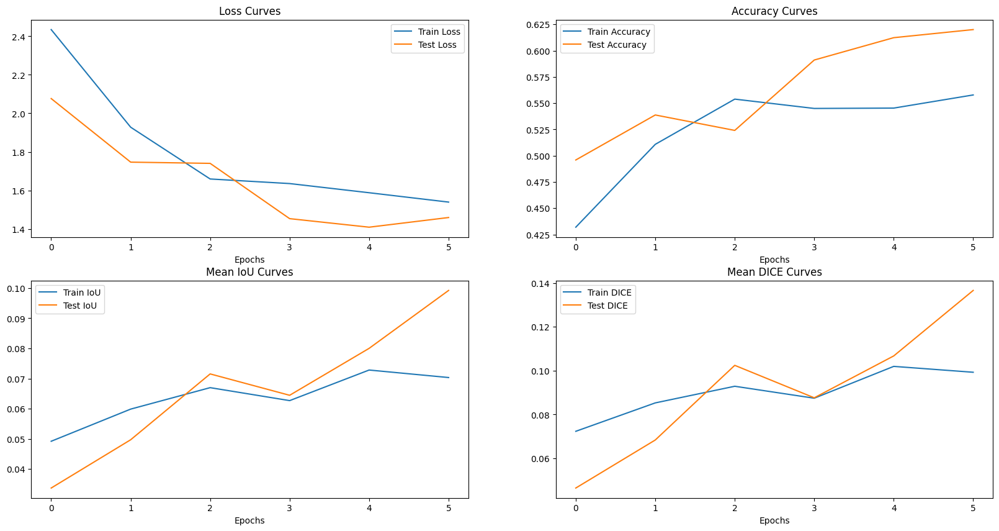

In [13]:
def plot_performance_metrics(model_result: dict):
    """
    Plot the performance metrics from training and testing the model.
    Parameters:
        model_result: A dict containing all the metrics.
    """
    epochs = range(len(model_result['train_loss']))
    plt.figure(figsize=(20,10))

    # Plotting loss curves
    plt.subplot(2, 2, 1)
    plt.plot(epochs, model_result['train_loss'], label='Train Loss')
    plt.plot(epochs, model_result['test_loss'], label='Test Loss')
    plt.title('Loss Curves')
    plt.xlabel('Epochs')
    plt.legend()

    # Plotting loss curves
    plt.subplot(2, 2, 2)
    plt.plot(epochs, model_result['train_acc'], label='Train Accuracy')
    plt.plot(epochs, model_result['test_acc'], label='Test Accuracy')
    plt.title('Accuracy Curves')
    plt.xlabel('Epochs')
    plt.legend()

    # Plotting loss curves
    plt.subplot(2, 2, 3)
    plt.plot(epochs, model_result['train_iou_mean'], label='Train IoU')
    plt.plot(epochs, model_result['test_iou_mean'], label='Test IoU')
    plt.title('Mean IoU Curves')
    plt.xlabel('Epochs')
    plt.legend()

    # Plotting loss curves
    plt.subplot(2, 2, 4)
    plt.plot(epochs, model_result['train_dice_mean'], label='Train DICE')
    plt.plot(epochs, model_result['test_dice_mean'], label='Test DICE')
    plt.title('Mean DICE Curves')
    plt.xlabel('Epochs')
    plt.legend();

plot_performance_metrics(model_result=model0_result)

In [14]:
# Creating function to convert onehot prediction into an image
def onehot_to_rgbmask(onehot_mask: np.ndarray,
                      colormap: list,
                      save_mask: bool = False,
                      filename: str = 'mask.png',
                      verbose: bool = True):
        """
        Converts a onehot encoded mask into RGB mask.
        Parameters:
            onehot_mask: A array containing the mask in onehot encoded format
                         with shape (batch, classes, height, width).
            colormap: A list with all the RGB colors for every single class
                      in proper sequence.
            save_mask: A boolean to save the RGB mask into an image file.
            filename: A string for the filename of the RGB Mask.
            verbose: A boolean to display additional text details.
        Returns:
            output: A array that is converted from onehot mask to RGB mask in
                    shape HWC.
        """
        onehot_mask = np.array(onehot_mask)
        assert len(onehot_mask.shape) == 4 # Shape of the mask
        assert onehot_mask.shape[0] == 1 # One image in a batch
        assert len(colormap) == onehot_mask.shape[1] # Total number of classes

        # Getting the class with the highest probability
        onehot_mask = np.argmax(onehot_mask, axis=1)

        # Creating a array to fill the output
        output = np.zeros(onehot_mask.shape[1:] + (3,))

        # Changing the dimension to (HWC)
        onehot_mask = np.transpose(onehot_mask, (1, 2, 0))

        for label, color in enumerate(colormap):
            if label < len(colormap):
                # Matching the onehot label with the class label
                # Then replacing the values with the RGB color values.
                output[np.all(np.equal(onehot_mask, label), axis=-1)] = color

        output = output.astype(np.uint8)

        if save_mask:
            mask_img = Image.fromarray(output)
            mask_img.save(filename)

        if save_mask and verbose:
            print('[INFO] Onehot encoded mask has been converted into RGB mask.')
            print(f'[INFO] RGB mask is been saved to the location: "{filename}".')
        elif verbose:
            print('[INFO] Onehot encoded mask has been converted into RGB mask.')

        return output

def predict_and_save(model: torch.nn.Module,
                     pred_transform,
                     data_path: str,
                     file_ext: str,
                     colormap: list,
                     device: torch.device,
                     save_pred: bool = True,
                     save_dir: str = 'pred_result/',
                     verbose: bool = False):
    """
    Performs prediction and saves the prediction on a image or all the images in
    a directory.
    Parameters:
        model: A pytorch model for prediction.
        pred_transform: A transformation method to be used for modifying the
                        dataset before prediction.
        data_path: A image file path or a directory path with all the images
        file_ext: Extension of image file needs to be 'png' or 'jpg'.
        colormap: A list containing the classes to RGB color mapped in order.
        device: A pytorch device to set the model and data into cpu or cuda.
        save_pred: A boolean to whether save the predicted mask as a image file.
        save_dir: A string for the directory path to save the image file.
        verbose: A boolean for displaying information for all the files.
    Returns:
        A array containing all the predicted mask in shape BHWC
    """
    # Checking the data path is a file or dir
    if os.path.isdir(data_path):
        if file_ext in ['PNG', 'png', 'JPG', 'jpg']:
            filepath_list = glob.glob(os.path.join(data_path,
                                                   '*.' + file_ext.lower()))
        else:
            raise Exception('[ERROR] Check your file ext it should be either  \
                             "png" or "jpg".')
    elif os.path.isfile(data_path):
        filepath_list = [data_path]
    else:
        raise Exception('[ERROR] Only file or directory is allowed for data path.')

    pred_mask = []

    for fpath in tqdm(filepath_list):
        # Reading and transforming the image
        image = cv2.cvtColor(cv2.imread(fpath), cv2.COLOR_BGR2RGB)
        aug = pred_transform(image=image)
        image = aug['image'].unsqueeze(0).to(device)

        # Predicting using the model
        model.eval()
        with torch.inference_mode():
            pred = torch.softmax(model(image), 1)

            assert len(colormap) == pred.shape[1] # Checking classes size
            if not os.path.exists(save_dir): # Checking save dir
                os.makedirs(save_dir)
            pred_fname = os.path.join(save_dir, 'pred_' + fpath.split('/')[-1] \
                                                .split('.')[0] + '.png')

            # Converting the prediction into RGB mask and saving the mask
            pred_mask.append(onehot_to_rgbmask(onehot_mask=pred.cpu().detach().numpy(),
                                               colormap=colormap,
                                               save_mask=save_pred,
                                               filename=pred_fname,
                                               verbose=verbose))
    if save_pred and not verbose:
        print(f'[INFO] All the prediction is been saved to location: "{save_dir}"')

    return np.asarray(pred_mask)

In [15]:
# Predicting all the val/test set and saving the prediction
pred_result = predict_and_save(model=model,
                               pred_transform=val_transform,
                               data_path=VAL_IMG_DIR,
                               file_ext='jpg',
                               colormap=COLORMAP_LIST,
                               device=device)

  0%|          | 0/100 [00:00<?, ?it/s]

[INFO] All the prediction is been saved to location: "pred_result/"


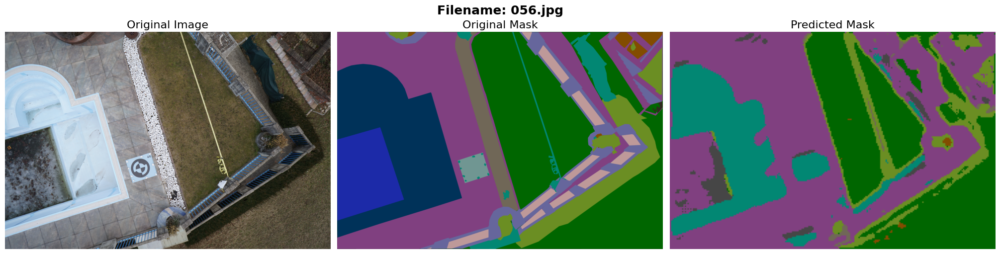

In [33]:
# Randomly comparing validation/testing images, masks and predicted masks
val_filelist = [i.split('/')[-1] for i in glob.glob(VAL_IMG_DIR + '/*')]
rand_sample = random.sample(val_filelist, 1)[0]
plt.figure(figsize=(20, 5), layout='constrained')

plt.suptitle(f'Filename: {rand_sample}', fontweight='bold', fontsize=18)
plt.subplot(1, 3, 1)
image = plt.imread(os.path.join(VAL_IMG_DIR, rand_sample))
plt.imshow(image)
plt.title('Original Image', fontsize=16)
plt.axis(False)

plt.subplot(1, 3, 2)
mask = plt.imread(os.path.join(VAL_MASK_DIR,
                               rand_sample.replace('.jpg','.png')))
plt.imshow(mask)
plt.title('Original Mask', fontsize=16)
plt.axis(False)

plt.subplot(1, 3, 3)
image = plt.imread(os.path.join('pred_result',
                                'pred_' + rand_sample.replace('.jpg','.png')))
plt.imshow(image)
plt.title('Predicted Mask', fontsize=16)
plt.axis(False);